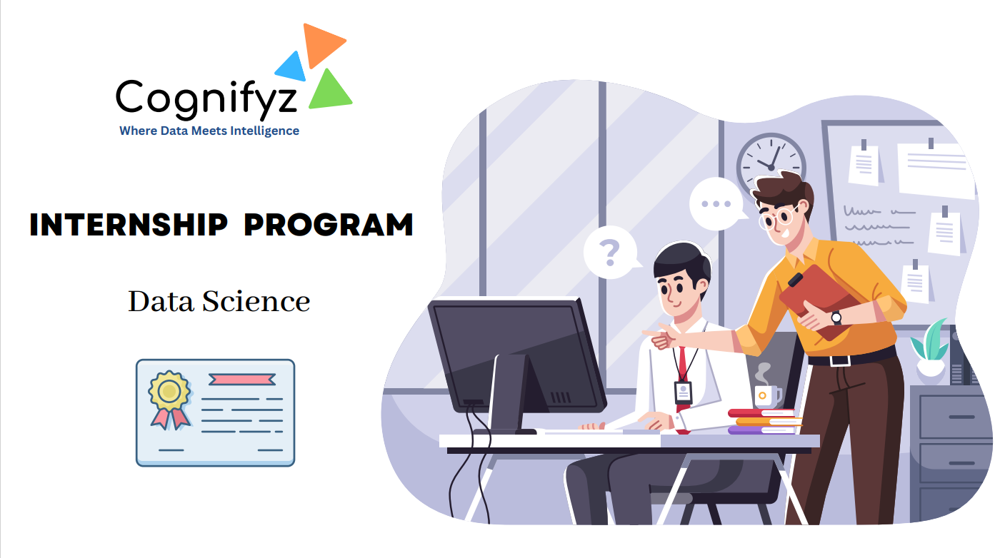

***Data Science Internship Program***
===================================

>**Industry-Cognifyz Technologies<br>
Name-Hari Om**

***Level 1***
===
***Task 1 : Data Exploration and Preprocessing :-***<br>
-Explore the dataset and identify the number of rows and columns.<br>
-Check for missing values in each column and handle them accordingly.<br>
-Perform data type conversion if necessary.Analyze the distribution of the target variable("Aggregate rating") and identify any class imbalances.

***Task 2: Descriptive Analysis:-***<br>
-Calculate basic statistical measures (mean,median, standard deviation, etc.) for numericalcolumns.<br>
-Explore the distribution of categorical variables like "Country Code," "City," and"Cuisines."<br>
-Identify the top cuisines and cities with the highest number of restaurants.<br>

***Task 3: Geospatial Analysis:-***<br>
-Visualize the locations of restaurants on a map using latitude and longitude information.<br>
-Analyze the distribution of restaurants across different cities or countries.<br>
-Determine if there is any correlation between the restaurant's location and its rating.<br>




<BR>

***Level 1***
===
***Task 1 : Data Exploration and Preprocessing :-***<br>
***------------------------------------------------------***


In [1]:
#import libraries import
import pandas as pd
import numpy as np
import matplotlib. pyplot as plt
import seaborn as sns;sns. set(color_codes=True)
%matplotlib inline
from shapely. geometry import Point
import geopandas as gpd
import geopandas as gdpdf
import folium as folium
from folium. plugins import MarkerCluster




In [2]:
# Load the dataset

data_set= pd.read_csv('C:/Users/hari9/Downloads/Dataset  (1).csv')

# 1. Identify the number of rows and columns
r,c = data_set.shape
print(f'Number of rows={r}\n\nNumber of columns={c}.')

Number of rows=9551

Number of columns=21.


In [3]:

# 2. Check for missing values in each column and handle them accordingly.
data_set.isnull().sum()


Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [4]:
"""3. Identify the data types of each column Perform data type conversion if necessary.
Analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances"""

print(data_set.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [5]:

"""3. Identify the data types of each column Perform data type conversion if necessary.
Analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances"""

t=data_set['Aggregate rating'].value_counts()
print("""distribution of targt variable:-
---------------------------------""")
t


distribution of targt variable:-
---------------------------------


Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64

***Task 2 :Descriptive Analysis :-***<br>
***-----------------------------------***

In [6]:
#1.Calculate basic statistical measures (mean,median, standard deviation, etc.) for numericalcolumns.
messures = data_set.describe()
print('Statistical Measures for Numerical Columns:-\n---------------------------------------------------')
messures

Statistical Measures for Numerical Columns:-
---------------------------------------------------


,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


C:\Users\hari9\AppData\Local\Temp\ipykernel_20196\4112249858.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Country Code',data=data_set,palette='rainbow')


Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64

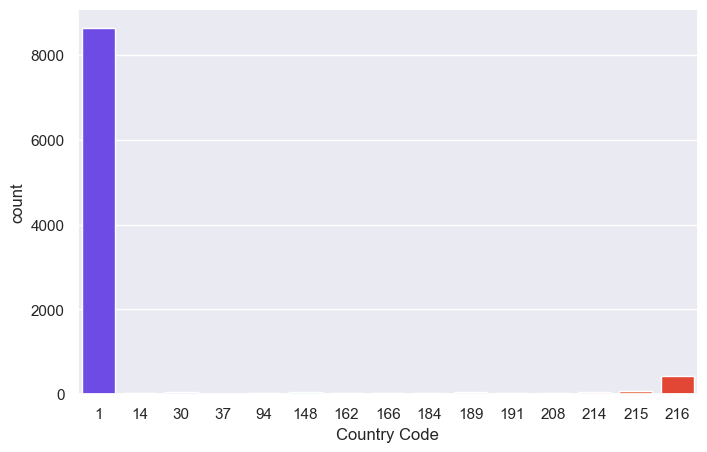

In [7]:
#2.Explore the distribution of categoricalvvariables like "Country Code," "City," and"Cuisines.

# Distribution of Country Code
country_code = data_set['Country Code'].value_counts()

plt.figure(figsize=(8,5))
sns.countplot(x='Country Code',data=data_set,palette='rainbow')
country_code

In [8]:
# Distribution of City
city = data_set['City'].value_counts()
city


City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64

In [9]:
#Distribution of Cuisines
data_set['Cuisines'] = data_set['Cuisines'].str.split(', ')
cuisine = data_set.explode('Cuisines')['Cuisines'].value_counts()
cuisine

Cuisines
North Indian      3960
Chinese           2735
Fast Food         1986
Mughlai            995
Italian            764
                  ... 
Fish and Chips       1
Malwani              1
Cuisine Varies       1
Soul Food            1
B�_rek               1
Name: count, Length: 145, dtype: int64

top_cities:-
-----------
 City
New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
Bhubaneshwar        21
Amritsar            21
Ahmedabad           21
Lucknow             21
Guwahati            21
Ludhiana            20
Rest of Hawaii      20
Kochi               20
Kolkata             20
Pocatello           20
Name: count, dtype: int64


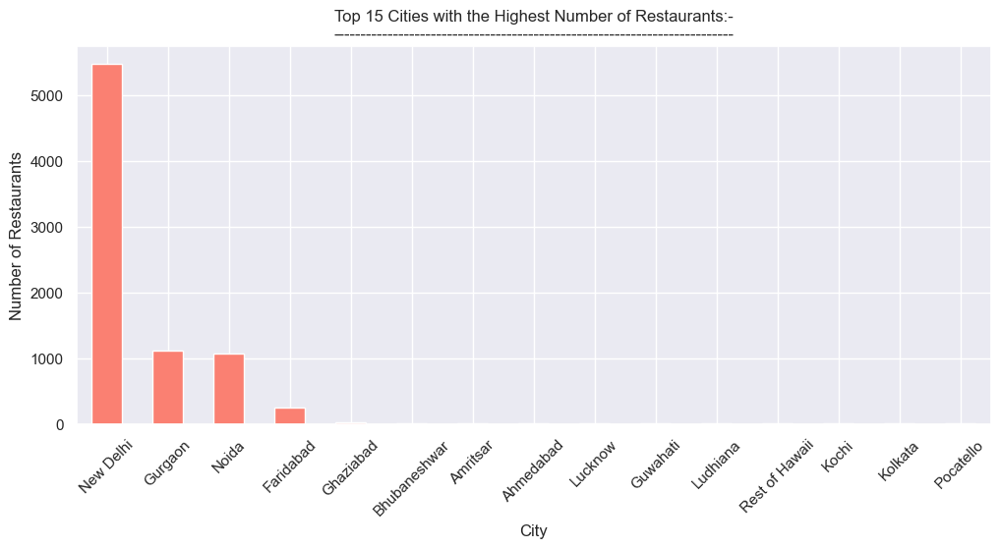

In [10]:
#3.Identify the top cuisines and cities with the highest number of restaurants

#top 15 cities with the highest number of restaurants
top_cities = city.head(15)
print("top_cities:-\n-----------\n", top_cities)
top_cities
plt.figure(figsize=(12, 5))
top_cities.plot(kind='bar', color='salmon')
plt.title("""Top 15 Cities with the Highest Number of Restaurants:-
--------------------------------------------------------------------------""")
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45)
plt.show()

top_cuisines:-
--------------
 Cuisines
North Indian    3960
Chinese         2735
Fast Food       1986
Mughlai          995
Italian          764
Bakery           745
Continental      736
Cafe             703
Desserts         653
South Indian     636
Street Food      562
American         390
Pizza            381
Mithai           380
Burger           251
Name: count, dtype: int64


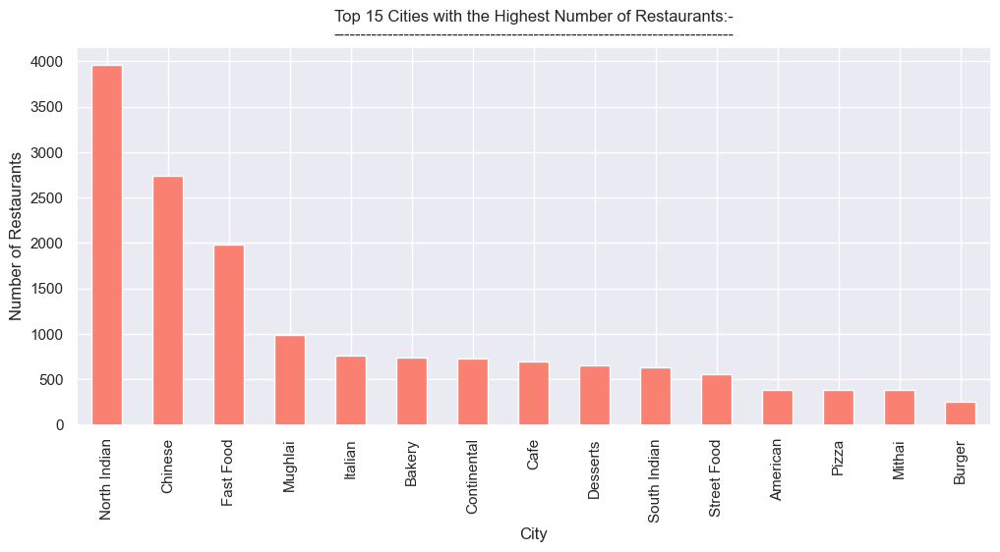

In [11]:
#top 15 cuisines with the highest number of restaurants
top_cuisines = cuisine.head(15)
print("top_cuisines:-\n--------------\n",top_cuisines)
top_cuisines
plt.figure(figsize=(12, 5))
top_cuisines.plot(kind='bar', color='salmon')
plt.title("""Top 15 Cities with the Highest Number of Restaurants:-
--------------------------------------------------------------------------""")
plt.xlabel('City')

plt.ylabel('Number of Restaurants')
plt.show()


***Task 3 :Geospatial Analysis :-***<br>
***-----------------------------------***

In [12]:
#1. Visualize the locations of restaurants on a map using latitude and longitude in formation.
latitude = data_set['Latitude'].mean()
longitude= data_set['Longitude'].mean()
restaurants = folium.Map(location=[latitude, longitude], zoom_start=3.5)
cluster = MarkerCluster().add_to(restaurants)
for index, row in data_set.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(cluster)
restaurants


Top 15 cities with the highest number of restaurants:-
------------------------------------------------------------
1. New Delhi
2. Gurgaon
3. Noida
4. Faridabad
5. Ghaziabad
6. Bhubaneshwar
7. Amritsar
8. Ahmedabad
9. Lucknow
10. Guwahati
11. Ludhiana
12. Rest of Hawaii
13. Kochi
14. Kolkata
15. Pocatello


C:\Users\hari9\AppData\Local\Temp\ipykernel_20196\1633926710.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=data_set['City'], order=top_cities, palette='rainbow')


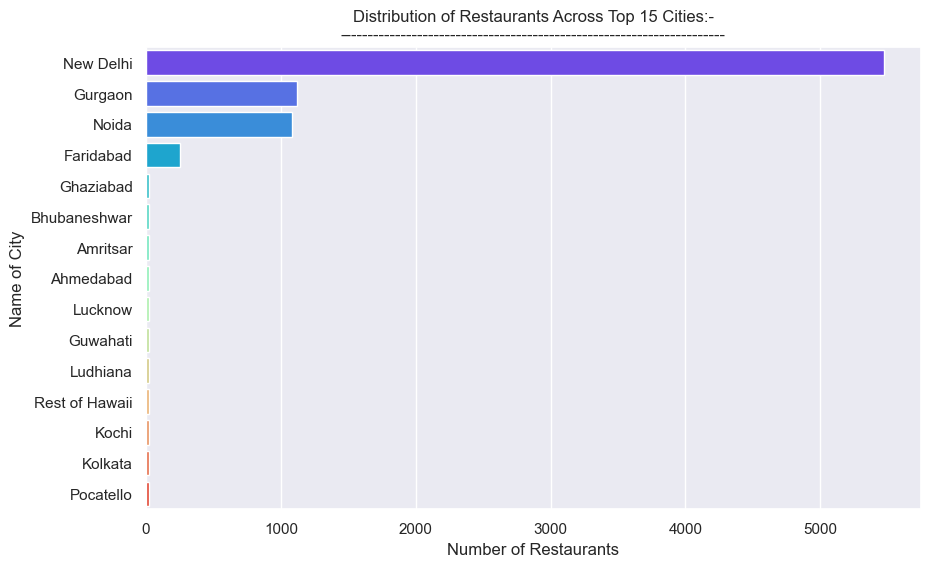

In [13]:
# 2. Analyze the distribution of restaurants across different cities or countries.
top_cities = data_set['City'].value_counts().head(15).index
print("""Top 15 cities with the highest number of restaurants:-
------------------------------------------------------------""")
city_counts = top_cities.values
for i, (city, count) in enumerate(zip(top_cities, city_counts), start=1):
    print(f"{i}. {city}")

plt.figure(figsize=(10, 6))
sns.countplot(y=data_set['City'], order=top_cities, palette='rainbow')
plt.xlabel('Number of Restaurants')
plt.ylabel('Name of City')
plt.title("""Distribution of Restaurants Across Top 15 Cities:-
----------------------------------------------------------------------""")
plt.show()


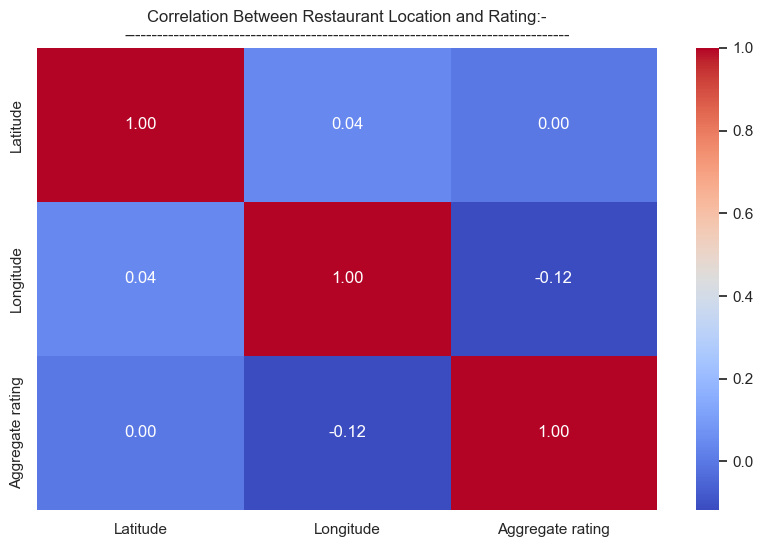

In [14]:
#3. Determine if there is any correlation between the restaurant's location and itsrating.
plt.figure(figsize=(10, 6))
correlation_matrix=data_set[['Latitude','Longitude','Aggregate rating']].corr()
sns.heatmap(correlation_matrix, annot=True,cmap='coolwarm',fmt='.2f')
plt.title("""Correlation Between Restaurant Location and Rating:-
---------------------------------------------------------------------------------""")
plt.show()